
# Capstone Module 6 - Advanced Analysis  
## What Factors Drive National Mortality Rates?

**Author:** [Ramu Kalidindi]  
**Date:** [06/09/2025]  

---

## Business Understanding

We aim to understand what factors most influence a nation's overall mortality rate.  
Specifically, is it driven by healthcare access, doctor-patient ratio, per capita income, education levels, or other factors?

**Goal:** Provide insights and actionable recommendations for policymakers to prioritize interventions that can lower mortality rates.


# 1. Data Loading and Cleaning

In [1]:

# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score

import xgboost as xgb

# Set visualization style
sns.set(style='whitegrid', palette='muted')


In [2]:

# Load data
df = pd.read_csv(r"Global Health Statistics.csv")

# Preview
df.head()


,Country,Year,Disease Name,Disease Category,Prevalence Rate (%),Incidence Rate (%),Mortality Rate (%),Age Group,Gender,Population Affected,...,Hospital Beds per 1000,Treatment Type,Average Treatment Cost (USD),Availability of Vaccines/Treatment,Recovery Rate (%),DALYs,Improvement in 5 Years (%),Per Capita Income (USD),Education Index,Urbanization Rate (%)
0,Italy,2013,Malaria,Respiratory,0.95,1.55,8.42,0-18,Male,471007,...,7.58,Medication,21064,No,91.82,4493,2.16,16886,0.79,86.02
1,France,2002,Ebola,Parasitic,12.46,8.63,8.75,61+,Male,634318,...,5.11,Surgery,47851,Yes,76.65,2366,4.82,80639,0.74,45.52
2,Turkey,2015,COVID-19,Genetic,0.91,2.35,6.22,36-60,Male,154878,...,3.49,Vaccination,27834,Yes,98.55,41,5.81,12245,0.41,40.20
3,Indonesia,2011,Parkinson's Disease,Autoimmune,4.68,6.29,3.99,0-18,Other,446224,...,8.44,Surgery,144,Yes,67.35,3201,2.22,49336,0.49,58.47
4,Italy,2013,Tuberculosis,Genetic,0.83,13.59,7.01,61+,Male,472908,...,5.90,Medication,8908,Yes,50.06,2832,6.93,47701,0.50,48.14


# 2. Data Cleaning

In [3]:

# Drop rows with missing critical values
df = df.dropna(subset=['Mortality Rate (%)', 'Healthcare Access (%)', 'Doctors per 1000', 'Per Capita Income (USD)', 'Education Index'])

# Encode categorical variables
df['Availability of Vaccines/Treatment'] = df['Availability of Vaccines/Treatment'].map({'Yes': 1, 'No': 0})
df['Gender'] = df['Gender'].map({'Male': 0, 'Female': 1, 'Other': 2})

# Confirm cleaning
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 22 columns):
 #   Column                              Non-Null Count    Dtype  
---  ------                              --------------    -----  
 0   Country                             1000000 non-null  object 
 1   Year                                1000000 non-null  int64  
 2   Disease Name                        1000000 non-null  object 
 3   Disease Category                    1000000 non-null  object 
 4   Prevalence Rate (%)                 1000000 non-null  float64
 5   Incidence Rate (%)                  1000000 non-null  float64
 6   Mortality Rate (%)                  1000000 non-null  float64
 7   Age Group                           1000000 non-null  object 
 8   Gender                              1000000 non-null  int64  
 9   Population Affected                 1000000 non-null  int64  
 10  Healthcare Access (%)               1000000 non-null  float64
 11  Doctors per 

# 3. Exploratory Data Analysis (EDA)

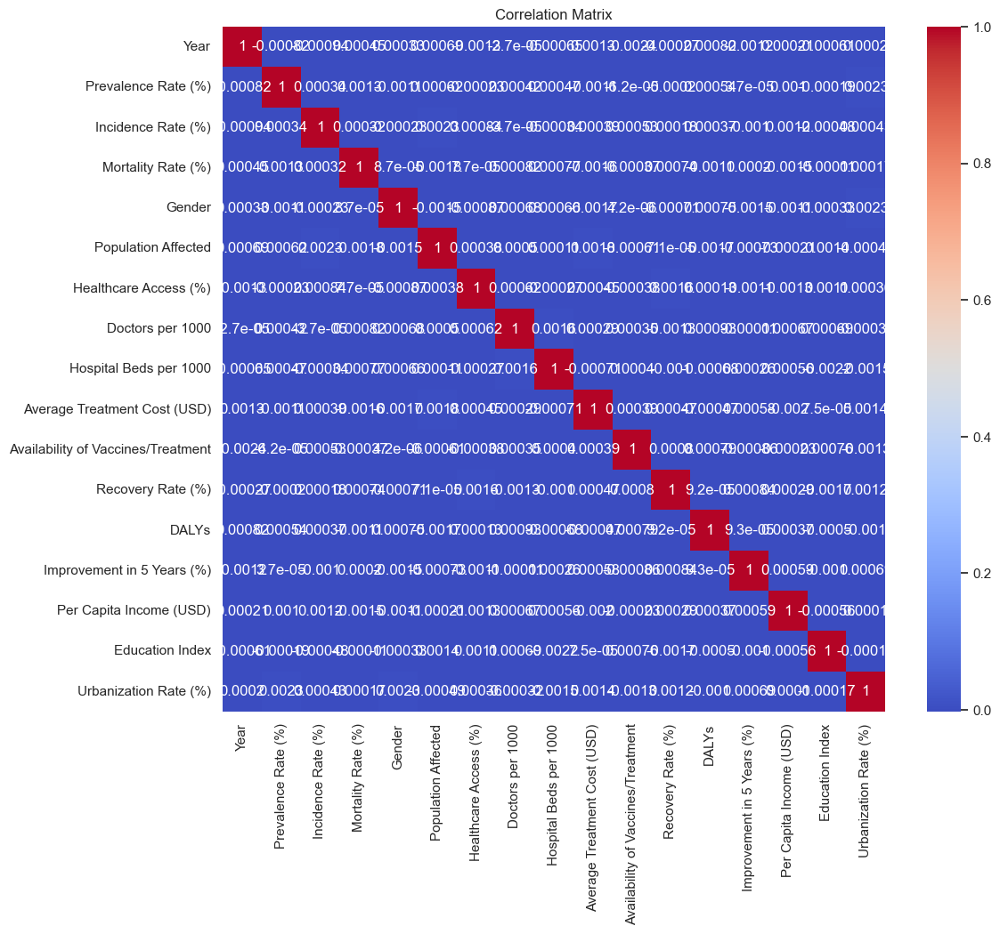

In [4]:

# Correlation Heatmap
numeric_df = df.select_dtypes(include=[np.number])
plt.figure(figsize=(12,10))
corr_matrix = numeric_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()


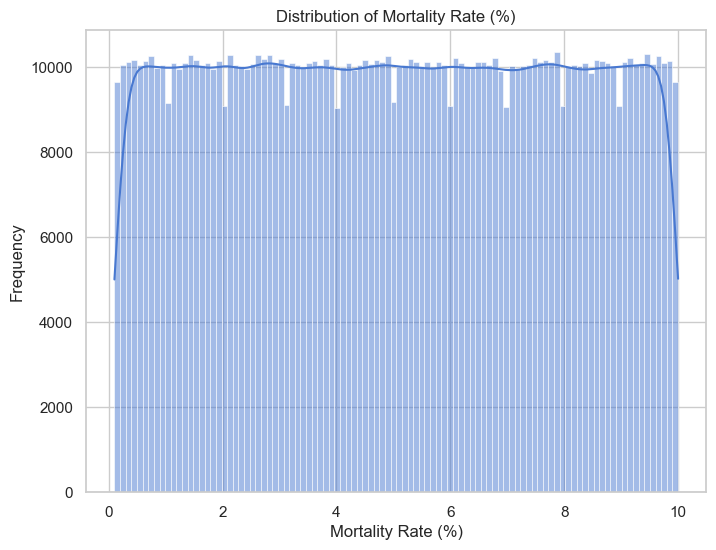

In [5]:

# Distribution of Mortality Rate
plt.figure(figsize=(8,6))
sns.histplot(df['Mortality Rate (%)'], kde=True)
plt.title('Distribution of Mortality Rate (%)')
plt.xlabel('Mortality Rate (%)')
plt.ylabel('Frequency')
plt.show()


# Checking for Synthetic Patterns in Key Variables

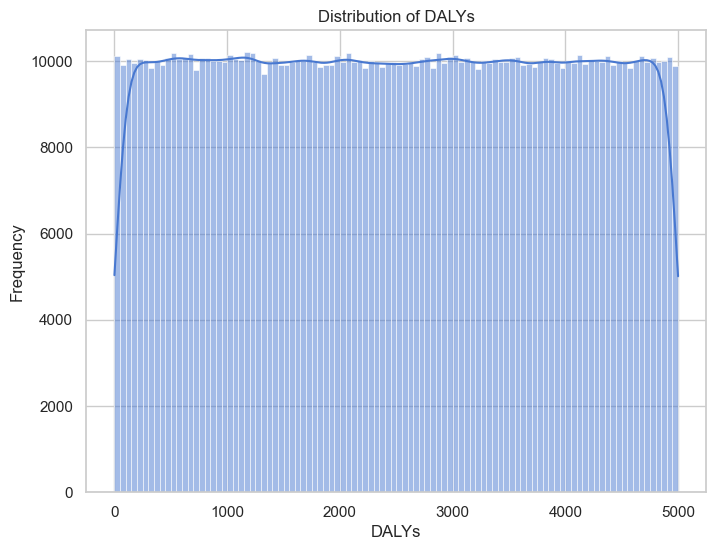

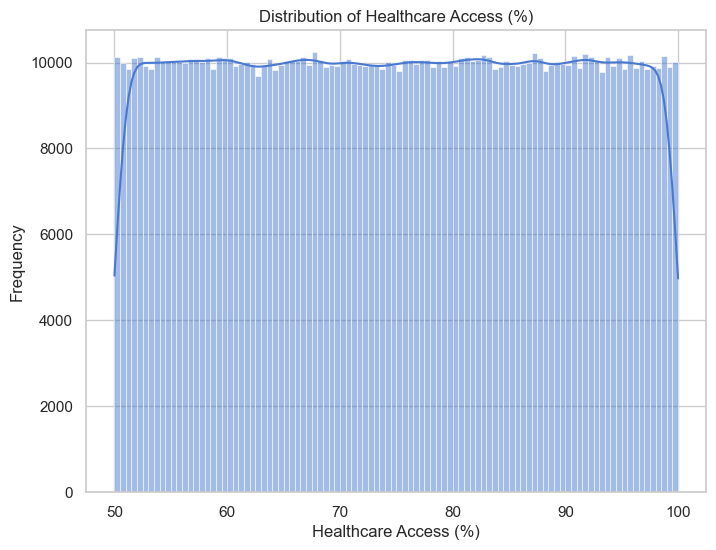

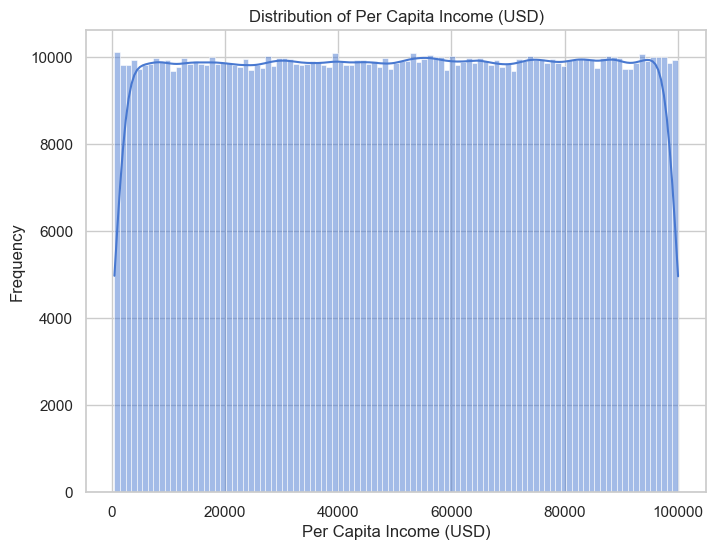

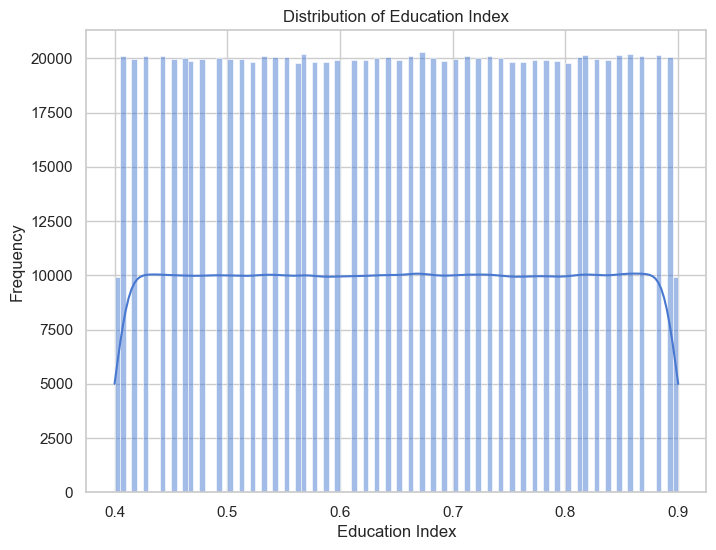

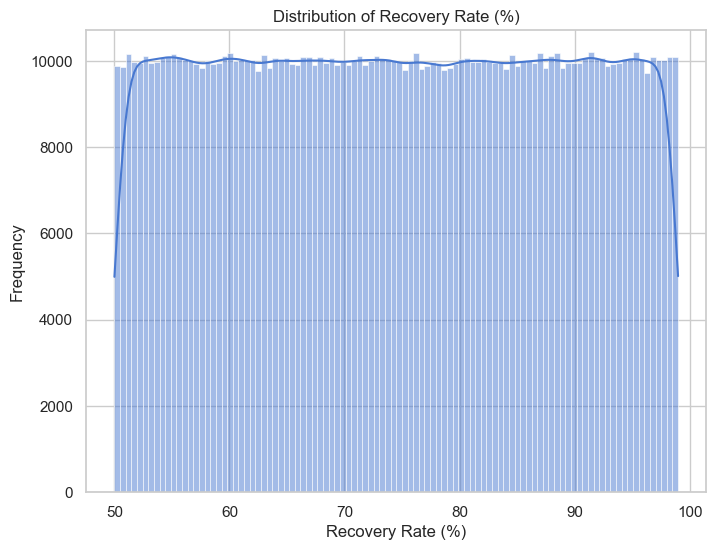

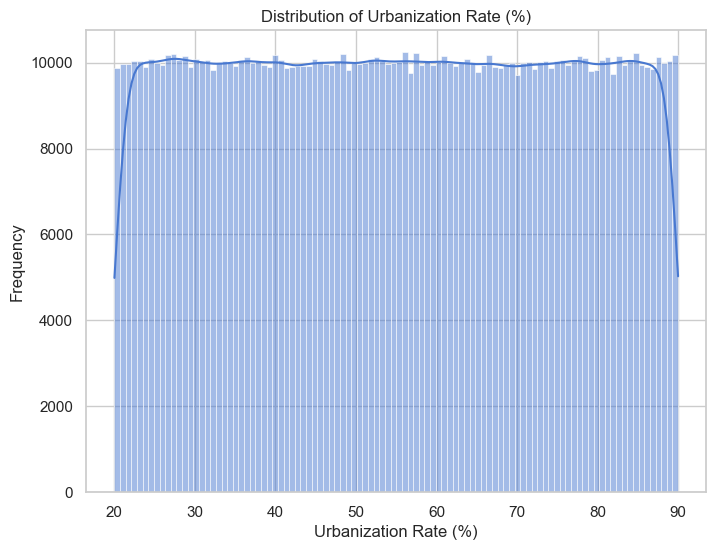

In [9]:
# List of key variables to check
key_vars = [
    'DALYs',
    'Healthcare Access (%)',
    'Per Capita Income (USD)',
    'Education Index',
    'Recovery Rate (%)',
    'Urbanization Rate (%)'
]

# Plot distributions
for col in key_vars:
    plt.figure(figsize=(8,6))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


 # Feature vs Mortality Rate Scatter Block

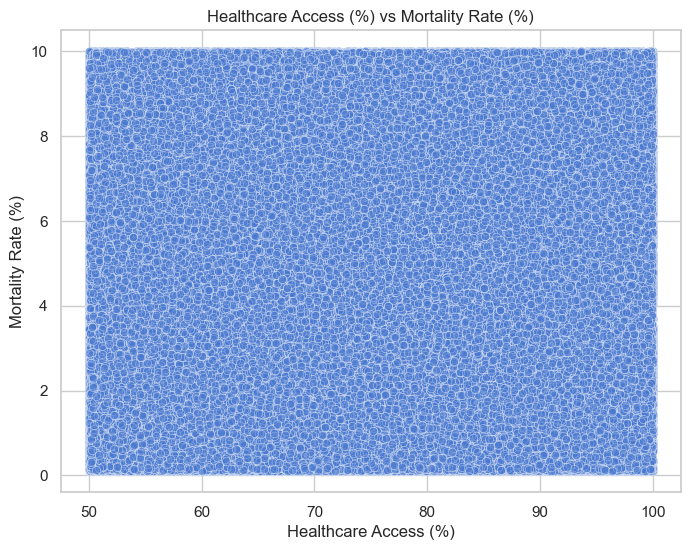

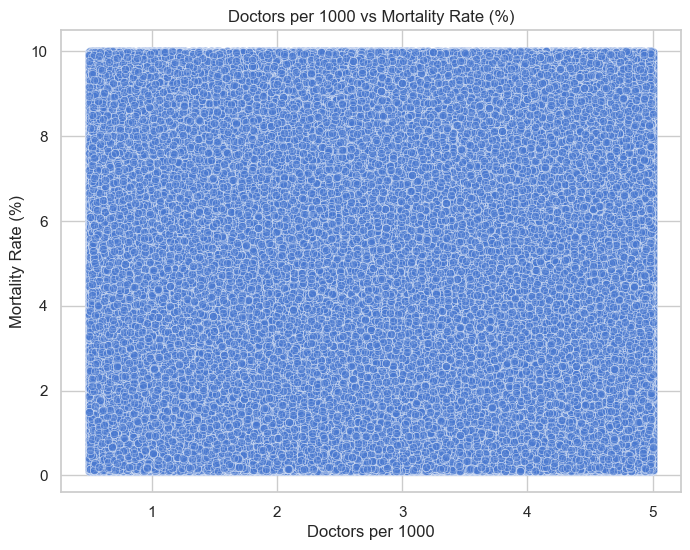

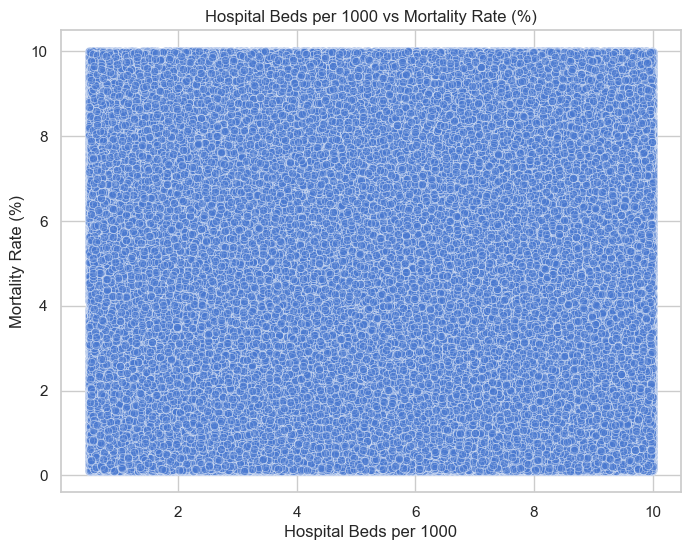

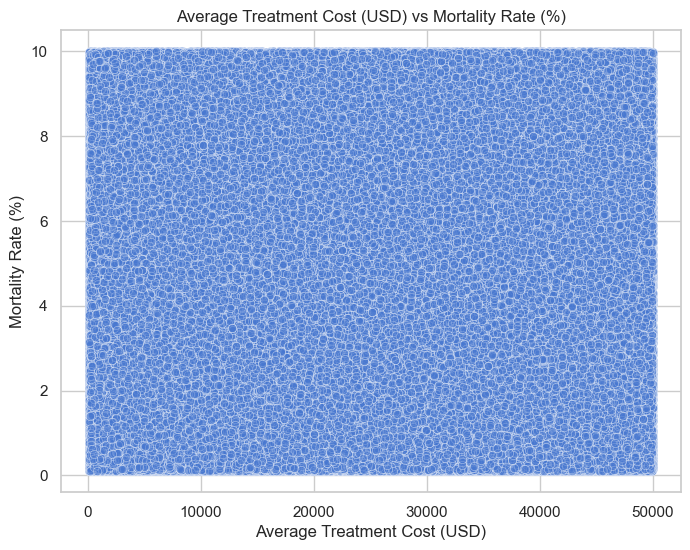

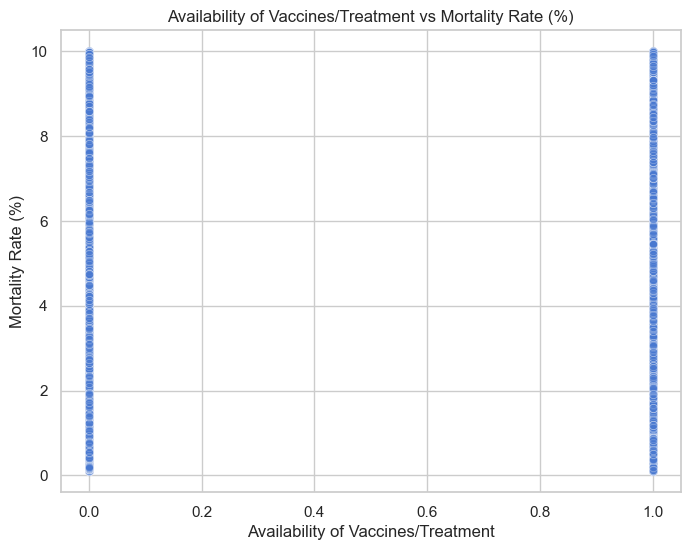

...

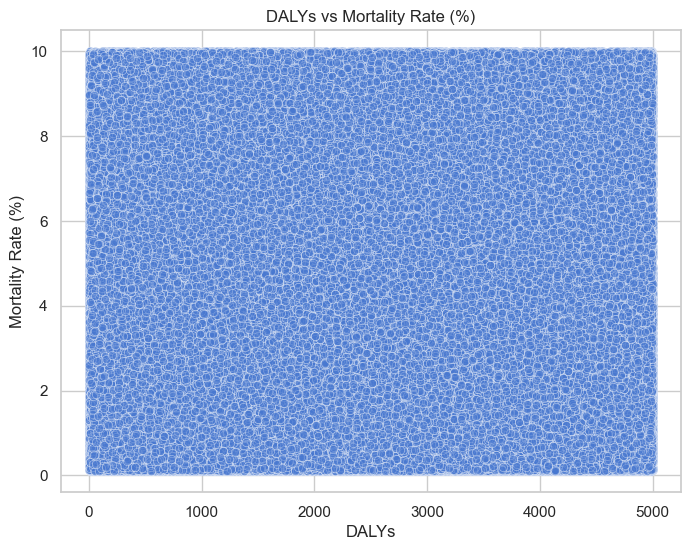

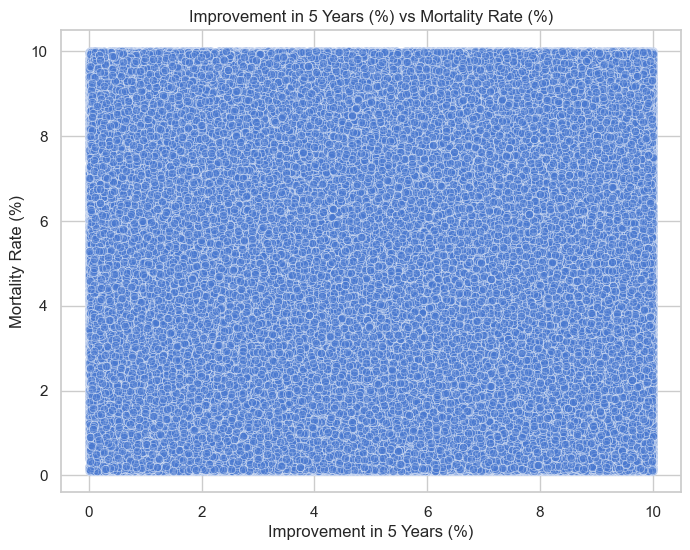

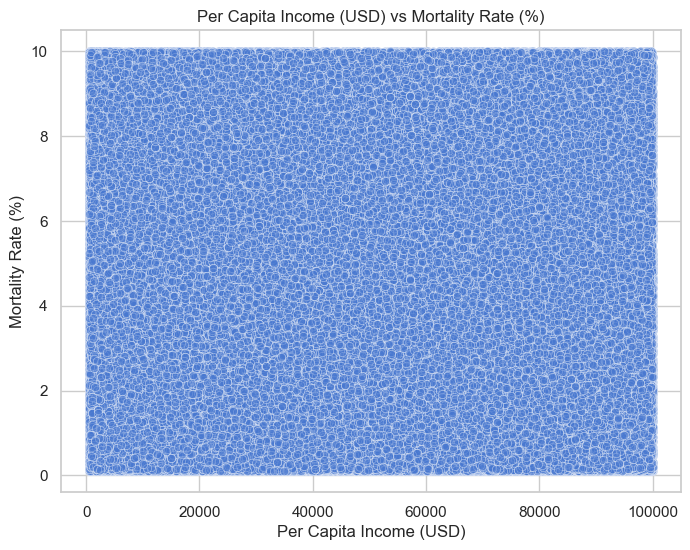

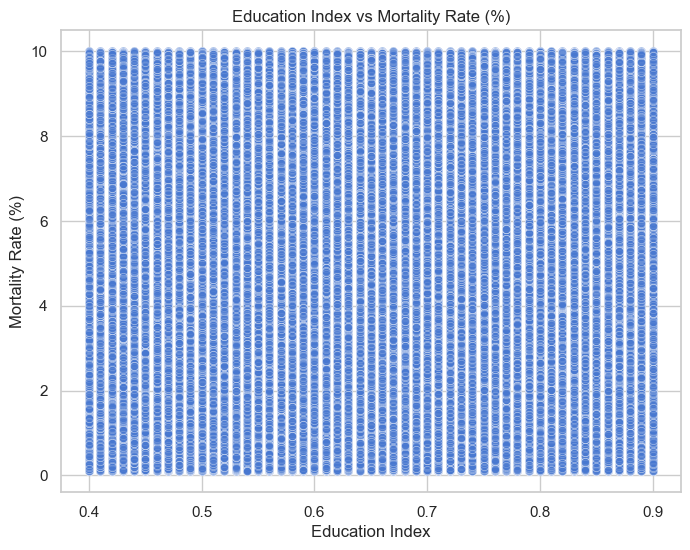

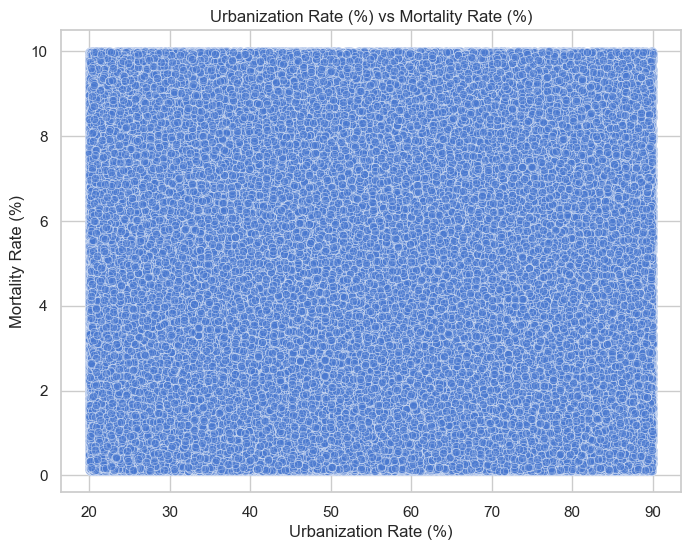

In [10]:
# List of features to plot vs Mortality Rate
features_vs_target = [
    'Healthcare Access (%)',
    'Doctors per 1000',
    'Hospital Beds per 1000',
    'Average Treatment Cost (USD)',
    'Availability of Vaccines/Treatment',
    'Recovery Rate (%)',
    'DALYs',
    'Improvement in 5 Years (%)',
    'Per Capita Income (USD)',
    'Education Index',
    'Urbanization Rate (%)'
]

# Plot scatterplots
for feature in features_vs_target:
    plt.figure(figsize=(8,6))
    sns.scatterplot(x=df[feature], y=df['Mortality Rate (%)'], alpha=0.5)
    plt.title(f'{feature} vs Mortality Rate (%)')
    plt.xlabel(feature)
    plt.ylabel('Mortality Rate (%)')
    plt.show()


In [ ]:
# Grid Version — Feature vs Mortality Rate (%) Scatterplots

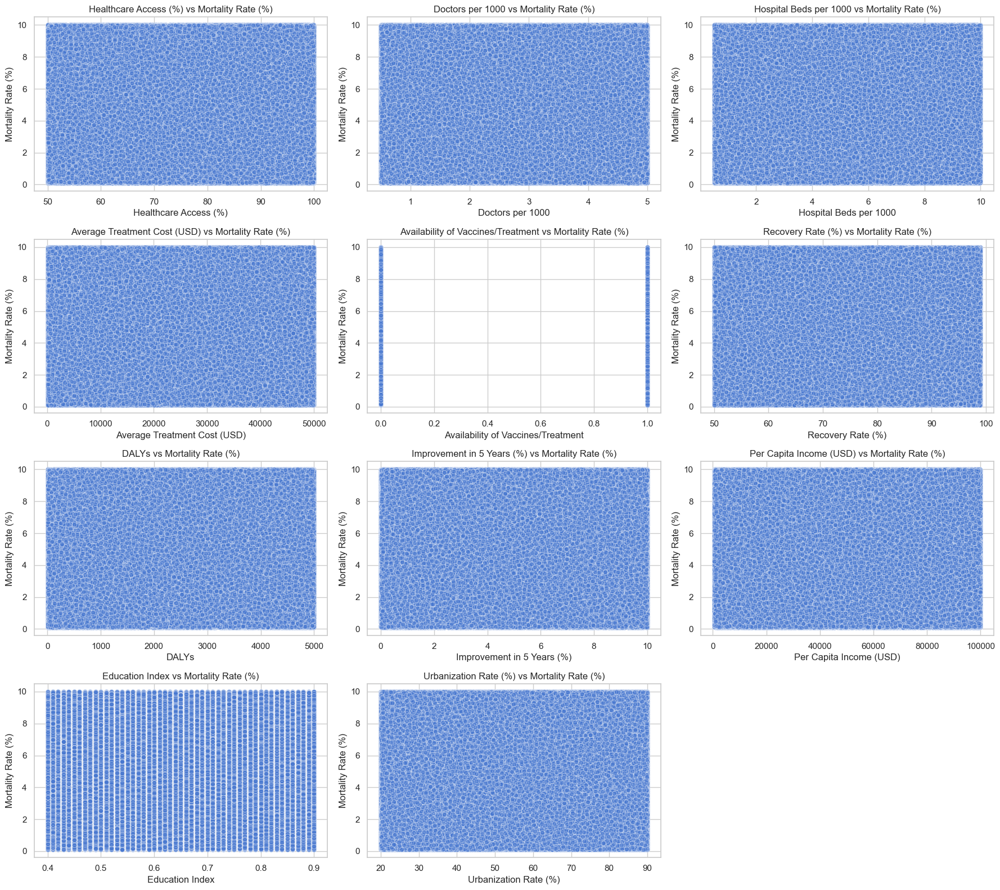

In [11]:
import matplotlib.pyplot as plt

# List of features to plot
features_vs_target = [
    'Healthcare Access (%)',
    'Doctors per 1000',
    'Hospital Beds per 1000',
    'Average Treatment Cost (USD)',
    'Availability of Vaccines/Treatment',
    'Recovery Rate (%)',
    'DALYs',
    'Improvement in 5 Years (%)',
    'Per Capita Income (USD)',
    'Education Index',
    'Urbanization Rate (%)'
]

# Define grid size
n_cols = 3
n_rows = int(np.ceil(len(features_vs_target) / n_cols))

# Create figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()

# Plot each feature
for i, feature in enumerate(features_vs_target):
    sns.scatterplot(x=df[feature], y=df['Mortality Rate (%)'], alpha=0.5, ax=axes[i])
    axes[i].set_title(f'{feature} vs Mortality Rate (%)')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Mortality Rate (%)')

# Remove empty subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


# Grid with Correlation Block:

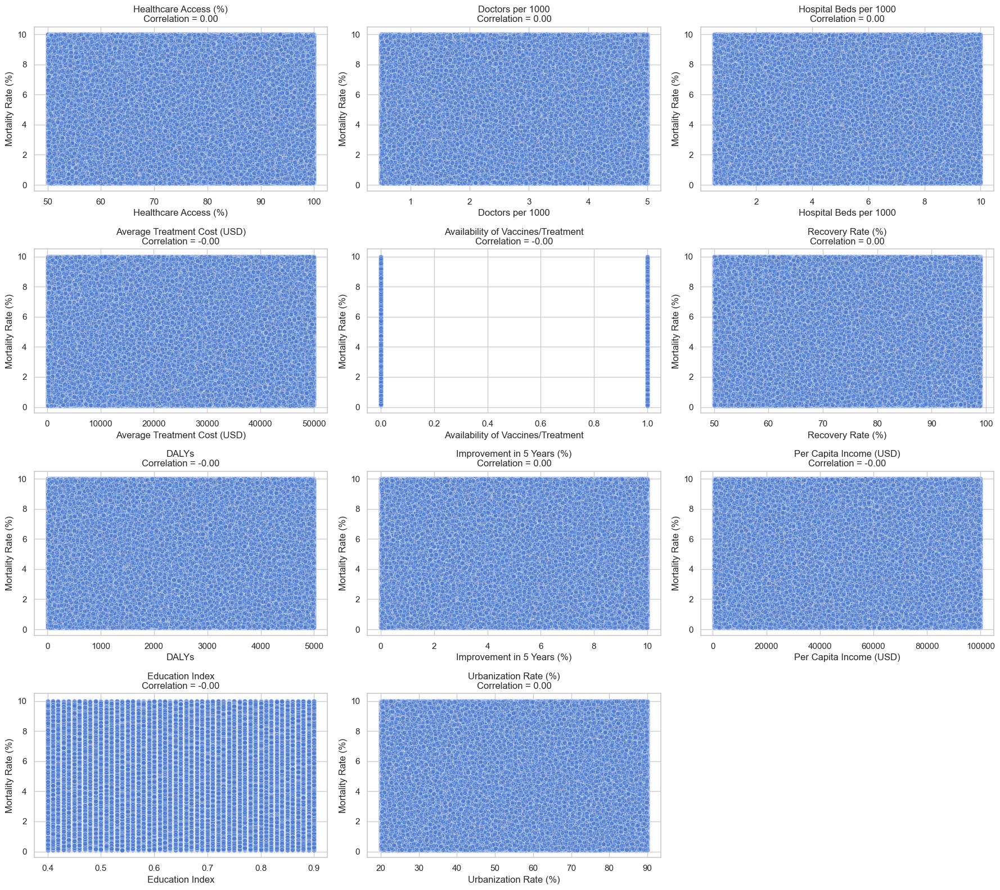

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# List of features to plot
features_vs_target = [
    'Healthcare Access (%)',
    'Doctors per 1000',
    'Hospital Beds per 1000',
    'Average Treatment Cost (USD)',
    'Availability of Vaccines/Treatment',
    'Recovery Rate (%)',
    'DALYs',
    'Improvement in 5 Years (%)',
    'Per Capita Income (USD)',
    'Education Index',
    'Urbanization Rate (%)'
]

# Define grid size
n_cols = 3
n_rows = int(np.ceil(len(features_vs_target) / n_cols))

# Create figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()

# Plot each feature with correlation coefficient
for i, feature in enumerate(features_vs_target):
    # Calculate Pearson correlation coefficient
    corr = df[feature].corr(df['Mortality Rate (%)'])
    
    # Plot scatterplot
    sns.scatterplot(x=df[feature], y=df['Mortality Rate (%)'], alpha=0.5, ax=axes[i])
    
    # Set title with correlation value
    axes[i].set_title(f'{feature}\nCorrelation = {corr:.2f}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Mortality Rate (%)')

# Remove empty subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


# 4. Feature Engineering

In [13]:

# Select features
features = ['Healthcare Access (%)', 'Doctors per 1000', 'Hospital Beds per 1000', 
            'Average Treatment Cost (USD)', 'Availability of Vaccines/Treatment',
            'Recovery Rate (%)', 'DALYs', 'Improvement in 5 Years (%)',
            'Per Capita Income (USD)', 'Education Index', 'Urbanization Rate (%)']

X = df[features]
y = df['Mortality Rate (%)']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# 5. PCA - Dimensionality Reduction

C:\Users\e968824\PycharmProjects\BrkAIML\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


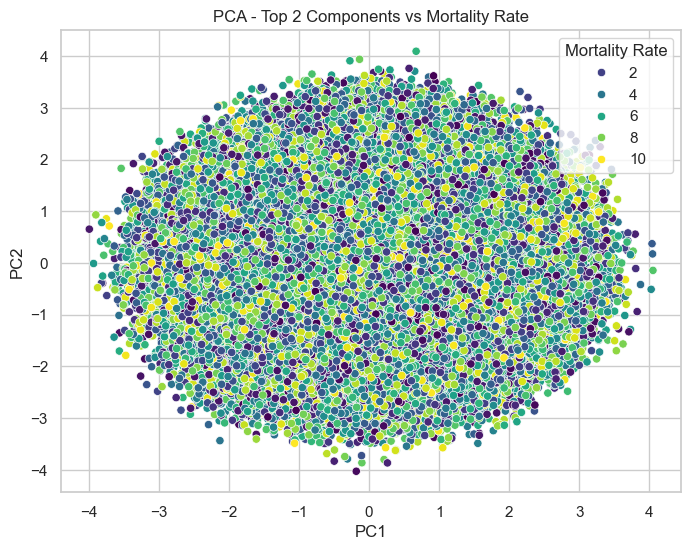

In [14]:

# PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['Mortality Rate'] = y

plt.figure(figsize=(8,6))
sns.scatterplot(x='PC1', y='PC2', hue='Mortality Rate', data=pca_df, palette='viridis')
plt.title('PCA - Top 2 Components vs Mortality Rate')
plt.show()


# 6. Regression Modeling

In [16]:

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Define models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=200, max_depth=20, random_state=42),
    "KNN": KNeighborsRegressor(n_neighbors=5),
    "MLP": MLPRegressor(hidden_layer_sizes=(64, 64), max_iter=1000, random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=200, max_depth=5, learning_rate=0.1, random_state=42)
}

# Train & Evaluate
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    results[name] = (r2, rmse)
    print(f"{name} R2: {r2:.3f} | RMSE: {rmse:.3f}")


Linear Regression R2: -0.000 | RMSE: 2.862


KeyboardInterrupt: 

In [15]:

# Feature Importances - XGBoost
xgb_model = models["XGBoost"]
xgb_importances = xgb_model.feature_importances_
feature_df = pd.DataFrame({'Feature': features, 'Importance': xgb_importances}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feature_df)
plt.title('XGBoost Feature Importances')
plt.show()


NotFittedError: need to call fit or load_model beforehand